In [0]:
!git clone https://github.com/tensorflow/models.git
!apt-get -qq install libprotobuf-java protobuf-compiler
!protoc ./models/research/object_detection/protos/string_int_label_map.proto --python_out=.
!cp -R models/research/object_detection/ object_detection/
!rm -rf models

Cloning into 'models'...
remote: Enumerating objects: 20, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 22670 (delta 6), reused 5 (delta 3), pack-reused 22650
Receiving objects: 100% (22670/22670), 562.76 MiB | 28.45 MiB/s, done.
Resolving deltas: 100% (13166/13166), done.
Checking out files: 100% (2836/2836), done.
Selecting previously unselected package libprotobuf10:amd64.
(Reading database ... 22280 files and directories currently installed.)
Preparing to unpack .../libprotobuf10_3.0.0-9.1ubuntu1_amd64.deb ...
Unpacking libprotobuf10:amd64 (3.0.0-9.1ubuntu1) ...
Selecting previously unselected package libprotoc10:amd64.
Preparing to unpack .../libprotoc10_3.0.0-9.1ubuntu1_amd64.deb ...
Unpacking libprotoc10:amd64 (3.0.0-9.1ubuntu1) ...
Selecting previously unselected package libprotobuf-java.
Preparing to unpack .../libprotobuf-java_3.0.0-9.1ubuntu1_all.deb ...
Unpacking libprotobuf-java (3.0.0-9.1ubuntu1) ...
Sel

In [1]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt

from PIL import Image

from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

ModuleNotFoundError: ignored

In [0]:
# What model to download.
# MODEL_NAME = 'ssd_mobilenet_v1_coco_2017_11_17'

# model with more accurancy but up to you use a diferent model
MODEL_NAME = 'ssd_inception_v2_coco_2018_01_28'

MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('object_detection/training', 'fruit_detection.pbtxt')

NUM_CLASSES = 3

opener = urllib.request.URLopener()
opener.retrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)
tar_file = tarfile.open(MODEL_FILE)
for file in tar_file.getmembers():
  file_name = os.path.basename(file.name)
  if 'frozen_inference_graph.pb' in file_name:
    tar_file.extract(file, os.getcwd())
    
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')
    
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [0]:
!rm -r exported_graphs; mkdir exported_graphs
!export CHECKPOINT_NUMBER=NNNNN; python object_detection/export_inference_graph.py \
--input_type image_tensor \
--pipeline_config_path faster_rcnn_resnet101_pets.config \
--trained_checkpoint_prefix train/model.ckpt-${CHECKPOINT_NUMBER} \
--output_directory exported_graphs

In [0]:
PATH_TO_TEST_IMAGES_DIR = 'object_detection/images/test'
TEST_IMAGE_PATHS = []
for file in os.listdir(PATH_TO_TEST_IMAGES_DIR):
    if file.endswith(".jpg"):
        TEST_IMAGE_PATHS.append(os.path.join(PATH_TO_TEST_IMAGES_DIR, file))
#Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


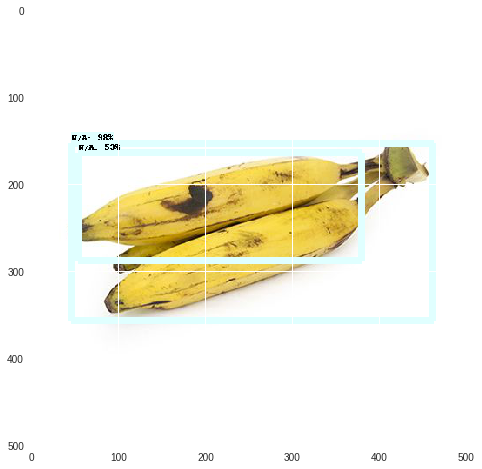

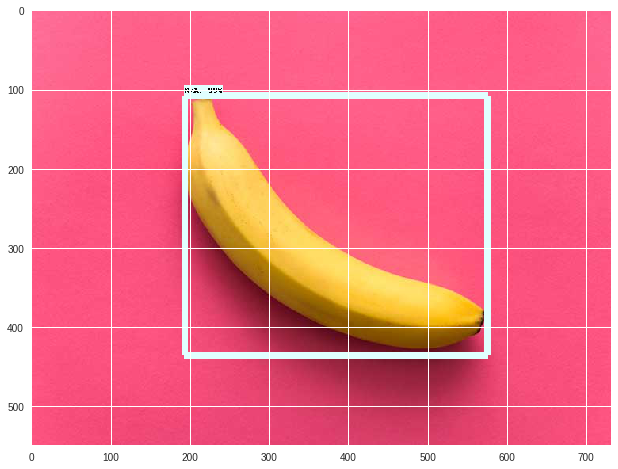

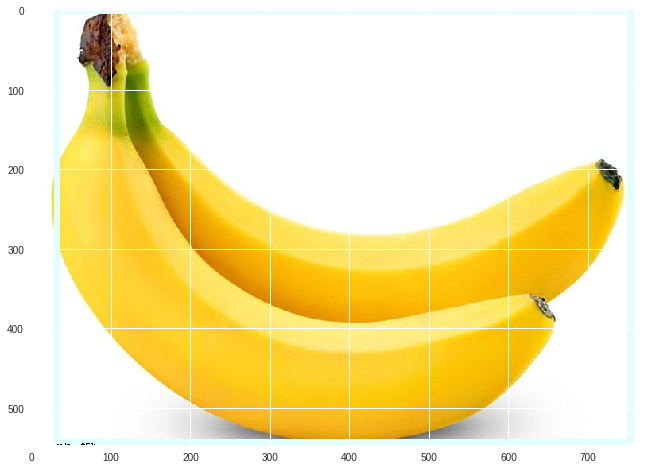

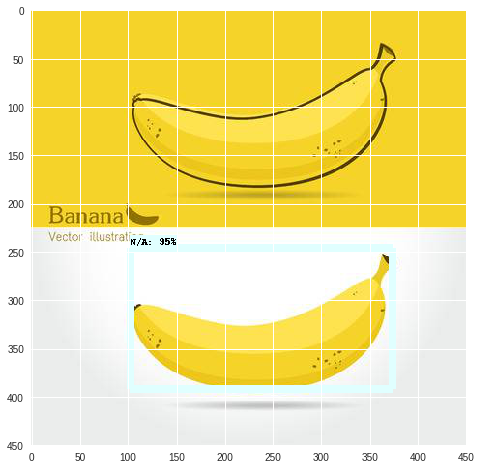

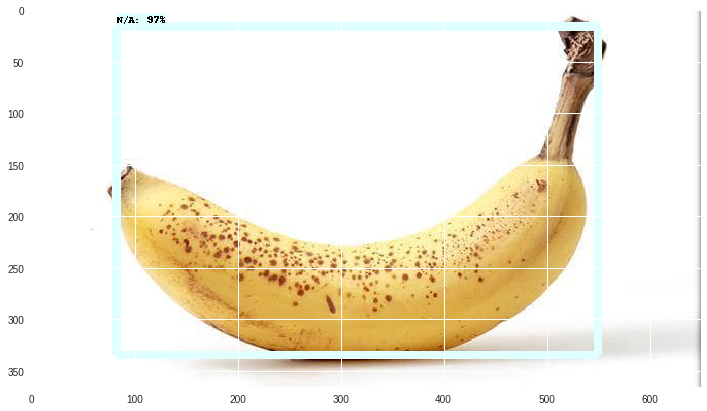

...

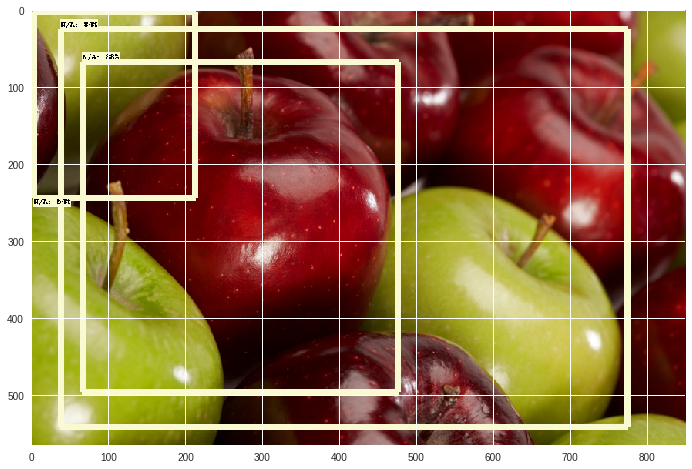

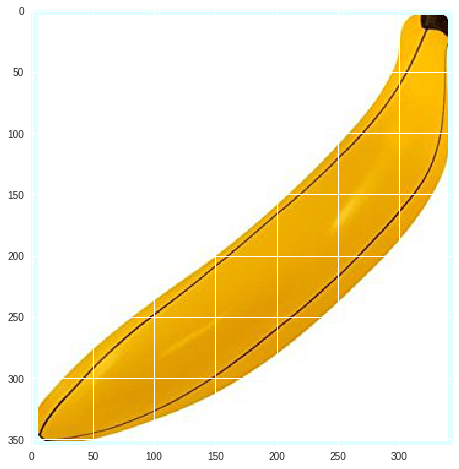

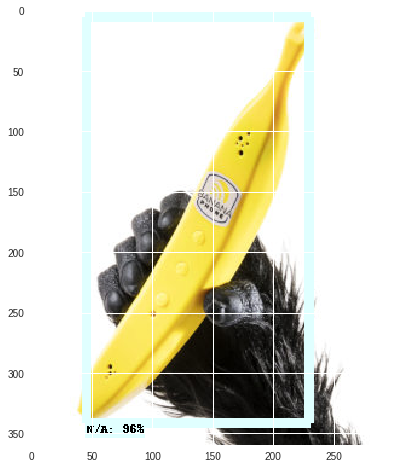

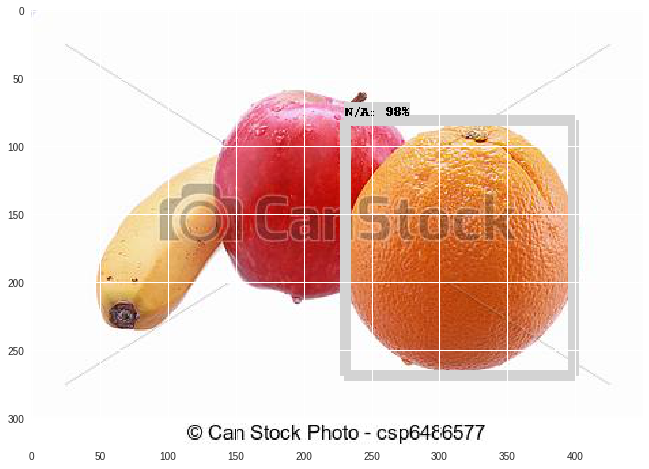

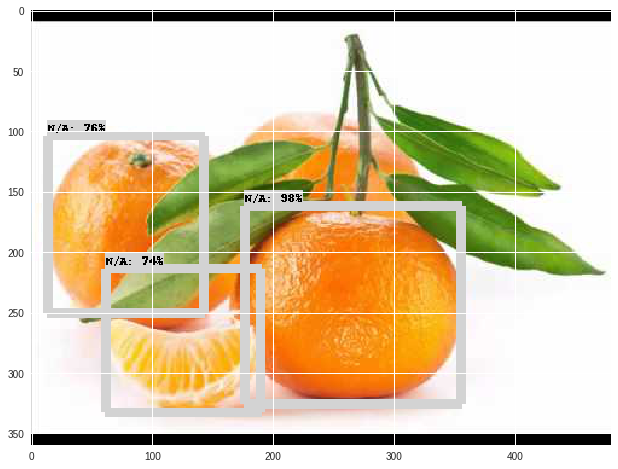

In [9]:
with detection_graph.as_default():
  with tf.Session(graph=detection_graph) as sess:
    # Definite input and output Tensors for detection_graph
    image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
    # Each box represents a part of the image where a particular object was detected.
    detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
    # Each score represent how level of confidence for each of the objects.
    # Score is shown on the result image, together with the class label.
    detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
    detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
    num_detections = detection_graph.get_tensor_by_name('num_detections:0')
    for image_path in TEST_IMAGE_PATHS:
      image = Image.open(image_path)
      # the array based representation of the image will be used later in order to prepare the
      # result image with boxes and labels on it.
      image_np = load_image_into_numpy_array(image)
      # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
      image_np_expanded = np.expand_dims(image_np, axis=0)
      # Actual detection.
      (boxes, scores, classes, num) = sess.run(
          [detection_boxes, detection_scores, detection_classes, num_detections],
          feed_dict={image_tensor: image_np_expanded})
      # Visualization of the results of a detection.
      vis_util.visualize_boxes_and_labels_on_image_array(
          image_np,
          np.squeeze(boxes),
          np.squeeze(classes).astype(np.int32),
          np.squeeze(scores),
          category_index,
          use_normalized_coordinates=True,
          line_thickness=8)
      plt.figure(figsize=IMAGE_SIZE)
      plt.imshow(image_np)

In [11]:
ls

object_detection/  ssd_inception_v2_coco_2018_01_28/
sample_data/       ssd_inception_v2_coco_2018_01_28.tar.gz


In [0]:
get_ipython().system_raw("python object_detection/legacy/train.py --logtostderr --train_dir=object_detection/training --pipeline_config_path=object_detection/training/ssd_inception_v2_coco.config 2>&1 /content/log/tb.log &")